###Autoria

Autoria: Jackson Corrêa

Linkedin: https://www.linkedin.com/in/jackson-corr%C3%AAa

GitHub: github.com/JacksonSCorrea

###O Projeto

Análise de Vendas Farmacêuticas: Uma visão geral das vendas de medicamentos.

Este projeto contempla a Análise Exploratória dos dados de vendas farmacêuticas. O Conjunto de Dados foi extraído da Plataformade Dados Abertos do Governo Federal. No projeto, foi considerado o mês de novembro de 2021.

Foi realizada inspeção dos dados, ajuste e tratamento de missing e outliers. Em seguida, a Análise foi realizada e, através da visualização de gráficos, foram extraídos insights valiosos para o negócio.

Também foram gerados mapas interativos com a biblioteca Folium. Os mapas mostram as etiquetas para as cidades, estados e regiões, informando percentual de vendas e medicamentos mais vendidos.

###Fonte de dados

O conjunto de dados, assim como o dicionário, foram extraídos do Portal Brasileiro de Dados Abertos, que pode ser acessad através do link:


https://dados.gov.br/dados/conjuntos-dados/venda-de-medicamentos-controlados-e-antimicrobianos---medicamentos-industrializados

###Dicionário de dados

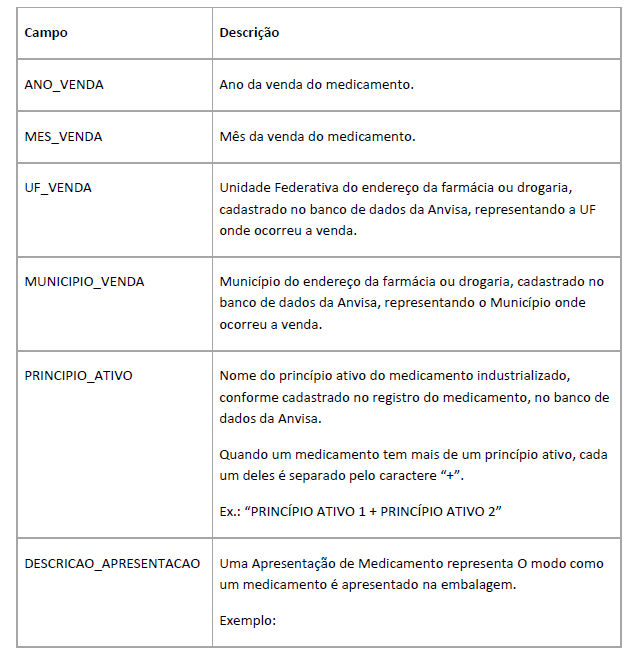

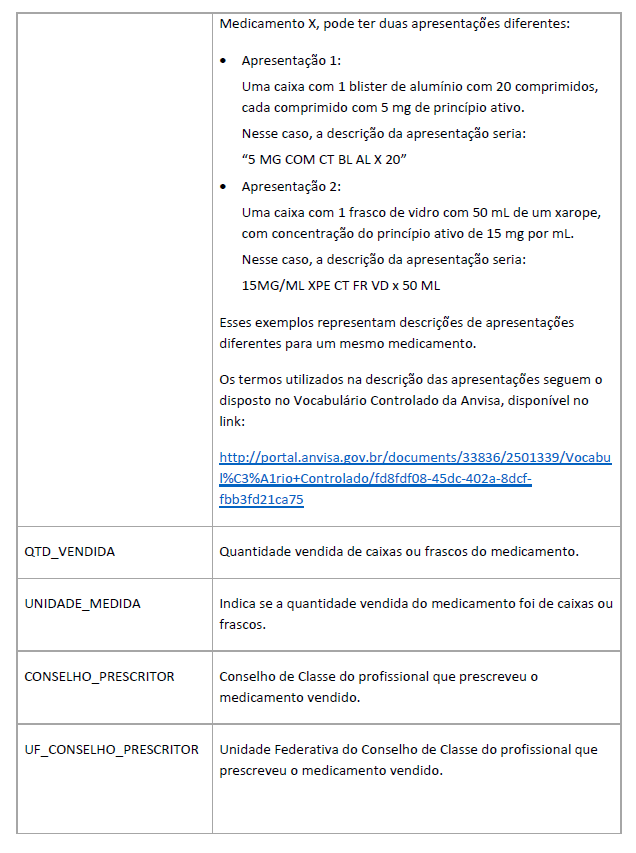

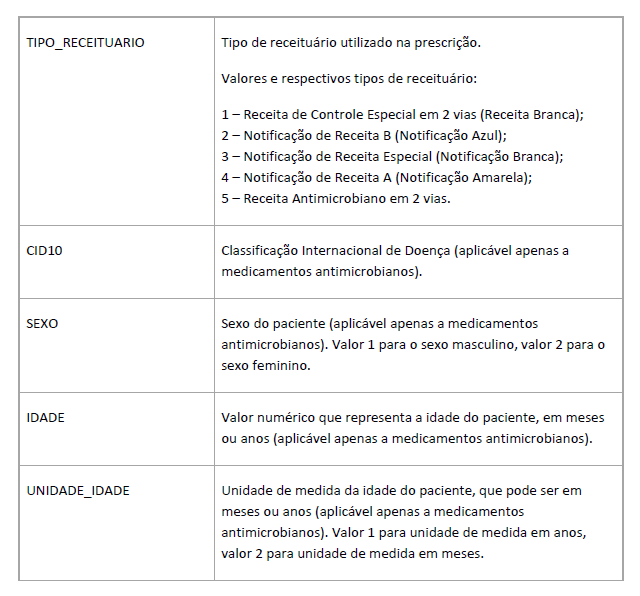

###Bibliotecas

In [ ]:
# Instalação
!pip install folium
!pip install unicode

In [ ]:
# Importação das bibliotecas
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FuncFormatter
import textwrap
import requests
import warnings
warnings.filterwarnings("ignore")
import folium
from geopy.geocoders import Nominatim
import unicodedata
import time
import json
from scipy import stats

### Funções

In [ ]:
def replace_outliers(df, **kwargs):
    """
    Substitui outliers por NaN em um DataFrame para cada variável numérica.

    :param df: DataFrame de entrada.
    :param threshold: Limiar para identificar outliers (opcional, padrão é 1.5).
    :return: DataFrame com outliers substituídos por NaN.
    """
    df_copy = df.copy()
    k = kwargs.get('k', 1.5)

    # Itera sobre as colunas numéricas
    for column in df_copy.select_dtypes(include=['float64', 'int64']).columns:
        # Calcula o primeiro e terceiro quartis
        Q1 = df_copy[column].quantile(0.25)
        Q3 = df_copy[column].quantile(0.75)

        # Calcula o IQR (Intervalo Interquartil)
        IQR = Q3 - Q1

        # Define o limite inferior e superior para identificar outliers
        lower_limit = Q1 - k * IQR
        upper_limit = Q3 + k * IQR

        # Substitui os outliers por NaN
        df_copy[column] = df_copy[column].apply(lambda x: np.nan if x < lower_limit or x > upper_limit else x)

    return df_copy

# =======================================================================================================================

def report_data(df, **kwargs):

  '''
  Função que cria um dataframe resumo de valores missing e outliers no dataframe original
  Argumento obrigatório: dataframe
  Argumento opcional: k (valor do fator de multiplicação para o cálculo do limite de outliers)
  '''

  df2 = pd.DataFrame()
  df2['feature'] = list(df.columns)
  df2['tipo'] = df.dtypes.values
  df2['cardinal'] = df.nunique().values
  df2['qtd miss'] = df.isnull().sum().values
  df2['perc miss'] = round(100 * df2['qtd miss'] / df.shape[0] , 1)



  Q1 = df.quantile(0.25)    #primeiro quartil (percentil 25)
  Q3 = df.quantile(0.75)    #terceiro quartil (percentil 75)
  IIQ = Q3 - Q1             #intervalo interquartil
  k = kwargs.get('k', 1.5)  #Fator multiplicador
  LS = Q3 + k*IIQ           #Limite superior
  LI = Q1 - k*IIQ           #Limite inferior

  df2['qtd out sup'] = df[df.select_dtypes(include=['float64', 'int64', 'float32' , 'int32'])>LS].count().values
  df2['perc out sup'] = round(100 * df2['qtd out sup'] / df.shape[0] , 1)


  df2['qtd out inf'] = df[df.select_dtypes(include=['float64', 'int64', 'float32' , 'int32'])<LI].count().values
  df2['perc out inf'] = round(100 * df2['qtd out inf'] / df.count().values , 1)

  df2['qtd outliers'] = df2['qtd out sup'] + df2['qtd out inf']
  df2['perc outliers'] = round(100 * df2['qtd outliers'] / df.count().values , 1)

  dup = df.duplicated().sum()
  print(f'\nQuantidade de linhas duplicadas: {dup}')


  return df2

# =======================================================================================================================

def plot_scatter(df, x_var, y_var, figsize, **kwargs):

    '''Função para plotar o gráfico de dispersão entre variáveis'''

    # Extraindo os argumentos opcionais e atribuindo os valores default
    color = kwargs.get('color', 'deepskyblue')
    marker = kwargs.get('marker', 'o')
    label_size = kwargs.get('label_size', 11)
    grid = kwargs.get('grid', False)

    # Gráfico
    fig, ax = plt.subplots(figsize=figsize)

    sns.scatterplot(data=df, x=x_var, y=y_var, color=color, marker=marker, ax=ax)

    ax.set_title(f'Scatter Plot entre "{x_var}" e "{y_var}"', pad=30, fontdict={'fontsize': 12, 'weight': 'bold'})
    ax.set_xlabel(x_var, fontsize=9)
    ax.set_ylabel(y_var, fontsize=9)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.tick_params(axis='y', labelsize=label_size)
    ax.grid(grid)

    plt.xticks(rotation=0)
    plt.yticks(rotation=0)

    plt.show()

# =======================================================================================================================

def plot_hist(df, var, figsize, **kwargs):

    '''Função para plotar o histgrama de uma variável'''

    # Extraindo os argumentos opcionais e atribuindo os valores default
    color = kwargs.get('color', 'deepskyblue')

    bins = kwargs.get('bins', 30)  # Número de bins no histograma

    pad = kwargs.get('pad', 30)

    label_size = kwargs.get('label_size', 9)

    txt_rot = kwargs.get('txt_rot', 'v')

    stat = kwargs.get('stat', 'frequency')

    grid = kwargs.get('grid', False)


    if txt_rot == 'h':
        rotation = 0
    elif txt_rot == 'v':
        rotation = 90
    else:
        rotation = txt_rot

    # Gráfico
    fig, ax = plt.subplots(figsize=figsize)

    sns.histplot(data=df, x=var, bins=bins, color=color, ax=ax)

    ax.set_title(f'Histograma da variável "{var}"', pad=pad, fontdict={'fontsize': 12, 'weight': 'bold'})
    ax.set_xlabel(var,  fontsize=9)
    ax.set_ylabel(stat, fontsize=9)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.tick_params(axis='x', labelsize=label_size)
    ax.tick_params(axis='y', labelsize=label_size)
    ax.grid(grid)

    plt.xticks(rotation=rotation)

    plt.show()

# =======================================================================================================================

def plot_bar(df, var, figsize, **kwargs):
    '''
    Função para plotar o gráfico de barras de uma única variável
    Pode ser entendido como o gráfico de distribuição das categorias de uma variável
    '''

    import textwrap  # Importe a função textwrap

    df_aux = df.copy()
    df_aux[var] = df_aux[var].astype(str)

    # Adicione os argumentos opcionais "top" e "ascending"
    ascending = kwargs.get('ascending', False)
    top = kwargs.get('top', None)

    df_grouped = df_aux.groupby(var).size().sort_values(ascending=ascending)

    tot = df_grouped.sum()
    x = df_grouped.index

    mode = kwargs.get('mode', 'percent')
    cutoff = kwargs.get('corte', None)  # Novo argumento para o ponto de corte
    unity = kwargs.get('unity', '')

    if cutoff is not None:
        if mode == 'percent':
            cutoff_value = tot * (cutoff / 100)
            small_categories = df_grouped[df_grouped < cutoff_value].index
            df_grouped[f'Outros\n(<{cutoff}%)'] = df_grouped[small_categories].sum()
            df_grouped.drop(small_categories, inplace=True)
            x = df_grouped.index
        elif mode == 'absolute':  # Handle cutoff for 'absolute' mode
            small_categories = df_grouped[df_grouped < cutoff].index
            df_grouped[f'Outros\n(<{cutoff}{unity})'] = df_grouped[small_categories].sum()
            df_grouped.drop(small_categories, inplace=True)
            x = df_grouped.index

    color = kwargs.get('color', 'deepskyblue')
    decimals = kwargs.get('decimals', 1)
    pad = kwargs.get('pad', 30)
    dist = kwargs.get('dist', 1)
    label_font = kwargs.get('label_height', 9)
    txt_rot = kwargs.get('txt_rot', 'h')
    title = kwargs.get('title', f'Variável "{var}"')


    if mode == 'percent':
        # Ajuste das proporções de acordo com o corte
        y = 100 * (df_grouped.values / df_grouped.values.sum())
        ylabel = 'Percentual (%)'
    elif mode == 'absolute':
        y = df_grouped.values
        ylabel = 'Número Absoluto'
    else:
        raise ValueError("O modo de exibição deve ser 'percent' ou 'absolute'.")

    if top is not None:
        # Exibir apenas as 10 primeiras barras, mas ajustar as proporções
        x = x[:top]
        y = y[:top]

    if txt_rot == 'h':
        rotation = 0
    elif txt_rot == 'v':
        rotation = 90
    else:
        rotation = txt_rot

    sns.set_style("ticks")

    fig, ax = plt.subplots(figsize=figsize)

    # Use a função textwrap.fill para formatar os rótulos do eixo X
    x = [textwrap.fill(label, 15) for label in x]

    sns.barplot(x=x, y=y, color=color, alpha=1)

    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    ax.set_yticklabels(ax.get_yticklabels(), visible=False)
    ax.set_title(f'{title}', pad=pad, fontdict={'fontsize': 12, 'weight': 'bold'})
    ax.set_xlabel('')
    ax.set_ylabel(ylabel)
    plt.gca().set_yticks([])
    plt.gca().set_ylabel('')
    ax.tick_params(axis='x', labelsize=9)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)

    for i, v in enumerate(y):
        if mode == 'percent':
            display_value = str(round(v, decimals)) + " %"
        elif mode == 'absolute':
            display_value = str(int(v))
        ax.text(i, v + dist, display_value + ' ' + unity, ha='center', va='bottom', fontsize=label_font, rotation=rotation)

    plt.show()


# =======================================================================================================================

def plot_bar_2var(df, var_x, var_y, figsize, **kwargs):
    '''
    Função para plotar o gráfico de barras entre duas variáveis
    Recebe como entrada as variáveis dos eixos X e Y
    '''

    df_aux = df.copy()

    df_aux[var_x] = df_aux[var_x].astype(str)
    df_aux[var_y] = df_aux[var_y].astype(float)

    # Adicione os argumentos opcionais "top" e "ascending"
    ascending = kwargs.get('ascending', False)
    top = kwargs.get('top', None)

    # Ordene o DataFrame com base no parâmetro "ascending"
    df_aux = df_aux.sort_values(by=var_y, ascending=ascending)

    # Aplicar o argumento "top" se especificado
    if top is not None:
        df_aux = df_aux.head(top)

    x = df_aux[var_x].tolist()
    y = df_aux[var_y].tolist()

    color = kwargs.get('color', 'deepskyblue')
    decimals = kwargs.get('decimals', 1)
    pad = kwargs.get('pad', 30)
    dist = kwargs.get('dist', 1)
    label_font = kwargs.get('label_height', 9)
    txt_rot = kwargs.get('txt_rot', 'h')
    title = kwargs.get('title', f'Gráfico de Barras de "{var_x}" por "{var_y}"')
    unity = kwargs.get('unity', '')

    if txt_rot == 'h':
        rotation = 0
    elif txt_rot == 'v':
        rotation = 90
    else:
        rotation = txt_rot

    sns.set_style("ticks")

    fig, ax = plt.subplots(figsize=figsize)

    sns.barplot(x=x, y=y, color=color, alpha=1)

    ax.set_title(f'{title}', pad=pad, fontdict={'fontsize': 12, 'weight': 'bold'})

    ax.set_xlabel(var_x)
    plt.gca().set_yticks([])
    plt.gca().set_ylabel('')
    ax.tick_params(axis='x', labelsize=9)
    ax.tick_params(axis='y', labelsize=9)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)

    for i, v in enumerate(y):
        display_value = str(round(v, decimals))
        ax.text(i, v + dist, display_value + unity, ha='center', va='bottom', fontsize=label_font, rotation=rotation)

    plt.xticks(rotation=90)

    plt.show()


 # =======================================================================================================================

# =======================================================================================================================

def plot_batch_boxplot(dataframe, **kwargs):
    """
    Plota boxplots estilizados com título simplificado para todas as
    variáveis numéricas do dataframe fornecido em um painel com gráficos
    configurados por linhas e colunas.

    :param dataframe: DataFrame para o qual os boxplots serão gerados.
    :param cols: Número de colunas no painel de gráficos (opcional, padrão é 3).
    :param num_size: Tamanho dos rótulos do eixo y de cada subplot (opcional, padrão é 11).
    :param color: Cor dos subplots (opcional, padrão é 'skyblue').
    :param b: largura do subplot (opcional, padrão é 15).
    """
    # Argumentos opcionais
    cols = kwargs.get('cols', 3)
    label_size = kwargs.get('label_size', 9)
    color = kwargs.get('color', 'deepskyblue')
    b = kwargs.get('b', 15)

    # Seleciona apenas colunas numéricas
    numeric_columns = dataframe.select_dtypes(include=['float64', 'int64']).columns

    # Calcula número de linhas
    nrows = len(numeric_columns) // cols + (len(numeric_columns) % cols > 0)

    # Inicializa o painel de gráficos
    fig, axes = plt.subplots(nrows=nrows, ncols=cols, figsize=(b, nrows * 5))

    # Ajusta o layout
    plt.tight_layout(pad=5, h_pad=8)

    # Configura estilo e paleta de cores
    sns.set_style("whitegrid")

    # Plota boxplots para cada coluna numérica
    for i, column in enumerate(numeric_columns):
        ax = axes[i // cols, i % cols]
        sns.boxplot(data=dataframe[column], ax=ax, color=color)
        ax.set_title(f'{column}', fontdict={'fontsize': 12, 'fontweight': 'bold'})
        ax.set_ylabel('')
        ax.tick_params(axis='both', which='major', labelsize=label_size)
        if label_size:
            ax.tick_params(axis='y', labelsize=label_size)

    # Remove gráficos vazios (se houver)
    for j in range(i + 1, nrows * cols):
        fig.delaxes(axes.flatten()[j])

    # Adiciona título principal
    fig.suptitle("Análise descritiva - BoxPlot", fontsize=16, fontweight='bold', y=1.005)

 # =======================================================================================================================

# =======================================================================================================================

def plot_batch_histogram(dataframe, **kwargs):
    """
    Plota histogramas estilizados com título simplificado para todas as
    variáveis numéricas do dataframe fornecido em um painel com gráficos
    configurados por linhas e colunas.

    :param dataframe: DataFrame para o qual os histogramas serão gerados.
    :param cols: Número de colunas no painel de gráficos (opcional, padrão é 3).
    :param label_size: Tamanho dos rótulos do eixo y de cada subplot (opcional, padrão é 9).
    :param color: Cor dos subplots (opcional, padrão é 'deepskyblue').
    :param kde: Se True, ativa KDE nos histogramas; se False, desativa (opcional, padrão é False).
    :param bins: Número de bins nos histogramas (opcional, padrão é 30).
    :param stat: Se 'percent', mostra o percentual de cada categoria; se 'frequency', mostra a frequência absoluta (opcional, padrão é 'frequency').
    :param grid: Se True, exibe o grid nos gráficos; se False, não exibe (opcional, padrão é False).
    """
    # Argumentos opcionais
    cols = kwargs.get('cols', 3)
    label_size = kwargs.get('label_size', 9)
    color = kwargs.get('color', 'deepskyblue')
    kde = kwargs.get('kde', False)
    bins = kwargs.get('bins', 30)
    stat = kwargs.get('stat', 'frequency')
    grid = kwargs.get('grid', False)
    b = kwargs.get('b', 15)

    # Seleciona apenas colunas numéricas
    numeric_columns = dataframe.select_dtypes(include=['float64', 'int64']).columns

    # Calcula número de linhas
    nrows = len(numeric_columns) // cols + (len(numeric_columns) % cols > 0)

    # Inicializa o painel de gráficos
    fig, axes = plt.subplots(nrows=nrows, ncols=cols, figsize=(b, nrows * 5))

    # Ajusta o layout
    plt.tight_layout(pad=5, h_pad=8)

    # Configura estilo e paleta de cores
    sns.set_style("whitegrid")

    # Plota histogramas para cada coluna numérica
    for i, column in enumerate(numeric_columns):
        ax = axes[i // cols, i % cols]
        sns.histplot(data=dataframe[column], ax=ax, color=color, kde=kde, bins=bins, stat=stat)
        ax.set_title(f'{column}', fontdict={'fontsize': 12, 'fontweight': 'bold'})
        ax.set_ylabel(stat)
        ax.tick_params(axis='both', which='major', labelsize=label_size)
        if label_size:
            ax.tick_params(axis='y', labelsize=label_size)
            ax.tick_params(axis='x', labelrotation=90)
            ax.get_yaxis().get_major_formatter().set_scientific(False)  # Formatação para números não em notação científica
        ax.grid(grid)

    # Remove gráficos vazios (se houver)
    for j in range(i + 1, nrows * cols):
        fig.delaxes(axes.flatten()[j])

    # Adiciona título principal
    fig.suptitle("Análise descritiva - Histograma", fontsize=16, fontweight='bold', y=1.005)

    # Configuração para desativar o grid
    if not grid:
        ax.grid(False)

    # Exibe os gráficos
    plt.show()

# =======================================================================================================================

def plot_batch_scatter(dataframe, y_variable, **kwargs):
    """
    Plota scatter plots para todas as variáveis numéricas do dataframe fornecido,
    em relação a uma variável específica fornecida como y_variable.

    :param dataframe: DataFrame para o qual os scatter plots serão gerados.
    :param y_variable: Nome da variável que será usada como eixo y nos scatter plots.
    :param cols: Número de colunas no painel de gráficos (opcional, padrão é 3).
    :param num_size: Tamanho dos rótulos do eixo y de cada subplot (opcional, padrão é 11).
    :param color: Cor dos subplots (opcional, padrão é 'skyblue').
    :param marker: Marcador para os pontos no scatter plot (opcional, padrão é 'o').
    :param grid: Se True, ativa o grid nos scatter plots; se False, desativa (opcional, padrão é True).
    """
    # Argumentos opcionais
    cols = kwargs.get('cols', 3)
    label_size = kwargs.get('label_size', 9)
    color = kwargs.get('color', 'deepskyblue')
    marker = kwargs.get('marker', 'o')
    grid = kwargs.get('grid', False)
    b = kwargs.get('b', 15)

    # Seleciona apenas colunas numéricas
    numeric_columns = dataframe.select_dtypes(include=['float64', 'int64']).columns

    # Calcula número de linhas
    nrows = len(numeric_columns) // cols + (len(numeric_columns) % cols > 0)

    # Inicializa o painel de gráficos
    fig, axes = plt.subplots(nrows=nrows, ncols=cols, figsize=(b, nrows * 5))

    # Ajusta o layout
    plt.tight_layout(pad=5, h_pad=8)

    # Configura estilo e paleta de cores
    sns.set_style("whitegrid")

    # Plota scatter plots para cada coluna numérica
    for i, column in enumerate(numeric_columns):
        ax = axes[i // cols, i % cols]
        sns.scatterplot(x=dataframe[column], y=dataframe[y_variable], ax=ax, color=color, marker=marker)
        ax.set_title(f'{column} X {y_variable}', fontdict={'fontsize': 12, 'fontweight': 'bold'})
        ax.set_xlabel(column)
        ax.set_ylabel(y_variable)
        ax.tick_params(axis='both', which='major', labelsize=label_size)
        if label_size:
            ax.tick_params(axis='y', labelsize=label_size)
        ax.grid(grid)

    # Remove gráficos vazios (se houver)
    for j in range(i + 1, nrows * cols):
        fig.delaxes(axes.flatten()[j])

    # Adiciona título principal
    fig.suptitle(f"Análise de Scatter Plots - {y_variable}", fontsize=16, fontweight='bold', y=1.005)

    # Configuração para desativar o grid
    if not grid:
        ax.grid(False)

# =======================================================================================================================


def plot_batch_bar(dataframe, card_max, **kwargs):
    """
    Plota gráficos de barras para todas as variáveis categóricas do dataframe fornecido,
    desde que o número de categorias seja menor ou igual a card_max.

    :param dataframe: DataFrame para o qual os gráficos serão gerados.
    :param card_max: Número máximo de categorias para exibir os gráficos de barras.
    :param cols: Número de colunas no painel de gráficos (opcional, padrão é 2).
    :param num_size: Tamanho dos rótulos do eixo y de cada subplot (opcional, padrão é 11).
    :param color: Cor dos subplots (opcional, padrão é 'deepskyblue').
    :param stat: Se 'percent', mostra o percentual de cada categoria; se 'frequency', mostra a frequência absoluta (opcional, padrão é 'percent').
    :param grid: Se True, exibe o grid nos gráficos; se False, não exibe (opcional, padrão é True).
    :param ascending: Se True, ordena as categorias em ordem crescente; se False, em ordem decrescente (opcional, padrão é False).
    """

    # Argumentos opcionais
    n_cols = kwargs.get('cols', 2)
    num_size = kwargs.get('num_size', 11)
    color = kwargs.get('color', 'deepskyblue')
    stat = kwargs.get('stat', 'percent')
    grid = kwargs.get('grid', True)
    label_size = kwargs.get('label_size', 9)
    b = kwargs.get('b', 15)
    h_pad = kwargs.get('h_pad', 8)

    # Filtra as colunas categóricas com até card_max categorias
    categorical_columns = [col for col in dataframe.columns if dataframe[col].dtype == 'object' or dataframe[col].dtype.name == 'category']

    # Calcula o número de linhas com base no número de colunas
    n_rows = (len(categorical_columns) + n_cols - 1) // n_cols

    # Configuração do tamanho da figura
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(b, n_rows * 5))

    # Ajusta o layout
    plt.tight_layout(pad=5, h_pad=h_pad)

    # Configuração do estilo e paleta de cores
    sns.set_style("whitegrid")

    # Plota gráficos de barras para cada coluna categórica
    for i, column in enumerate(categorical_columns):
        ax = axes[i // n_cols, i % n_cols]

        # Filtra as categorias com até card_max categorias
        counts = dataframe[column].value_counts()

        # Calcula o percentual em relação a todas as categorias
        counts_percent = (counts / counts.sum() * 100).sort_values(ascending=False)

        # Verifica se card_max é definido e, se for, pega as 30 maiores categorias
        if card_max is not None:
            counts_percent = counts_percent.head(card_max)

        if stat == 'percent':
            counts_percent.plot(kind='bar', ax=ax, color=color)
            ax.set_ylabel('Percentual (%)')
        else:
            counts.plot(kind='bar', ax=ax, color=color)
            ax.set_ylabel('Frequência Absoluta')
            ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))  # Formata os valores do eixo Y

        ax.set_title(f'{column}', fontdict={'fontsize': 11, 'fontweight': 'bold'})
        ax.set_xlabel('')
        ax.tick_params(axis='both', which='major', labelsize=11)
        ax.tick_params(axis='x', labelrotation=90)  # Rotação de 90 graus nos rótulos do eixo X
        ax.tick_params(axis='x', labelsize=label_size)
        ax.tick_params(axis='y', labelsize=label_size)
        ax.grid(grid)

        # Quebra de linha nos rótulos do eixo X
        ax.set_xticklabels([textwrap.fill(str(label), 20) for label in counts_percent.index], fontsize=9)

    # Remove gráficos vazios (se houver)
    for j in range(len(categorical_columns), n_rows * n_cols):
        fig.delaxes(axes.flatten()[j])

    # Adiciona título principal
    fig.suptitle("Análise descritiva - Gráfico de Barras", fontsize=16, fontweight='bold', y=1.005)

    # Exibe os gráficos
    plt.show()

###Importação dos dados

In [ ]:
#Ano e mês do dataset
txt='202111'

url = f'https://dados.anvisa.gov.br/dados/SNGPC/Industrializados/EDA_Industrializados_{txt}.csv'

# Faz o download do arquivo a partir do URL
response = requests.get(url)

# Verifica se a solicitação foi bem-sucedida
if response.status_code == 200:
    # Salva o conteúdo do arquivo na pasta "content" do Google Colab
    with open(f'/content/EDA_Industrializados_{txt}.csv', 'wb') as file:
        file.write(response.content)
    print('Arquivo baixado e salvo com sucesso!')
else:
    print('Erro ao baixar o arquivo:', response.status_code)

Arquivo baixado e salvo com sucesso!


In [ ]:
# Salva arquivo csv do dataset gerado

# df = pd.read_csv(f'/content/EDA_Industrializados_{txt}.csv', sep=';' , encoding = 'latin-1')
df = pd.read_csv(f'/content/drive/MyDrive/Colab Notebooks/Projetos pessoais/01. Projetos Machine Learning/Vendas farmacêuticas [PoD]/EDA_Industrializados_202111.csv', sep=';' , encoding = 'latin-1')

###Inspeção dos dados

In [ ]:
# Visualizando as linhas iniciais
df.head(5)

,ANO_VENDA,MES_VENDA,UF_VENDA,MUNICIPIO_VENDA,PRINCIPIO_ATIVO,DESCRICAO_APRESENTACAO,QTD_VENDIDA,UNIDADE_MEDIDA,CONSELHO_PRESCRITOR,UF_CONSELHO_PRESCRITOR,TIPO_RECEITUARIO,CID10,SEXO,IDADE,UNIDADE_IDADE
0,2021,11,MT,TANGARÁ DA SERRA,SULFAMETOXAZOL + TRIMETOPRIMA,800 MG + 160 MG COM CT BL AL PLAS TRANS X 10,1,CAIXA,CRM,MT,5.0,NaN,1.0,37.0,1.0
1,2021,11,MT,TANGARÁ DA SERRA,SULFAMETOXAZOL + TRIMETOPRIMA,800 MG + 160 MG COM CT BL AL PLAS TRANS X 10,1,CAIXA,CRM,MT,5.0,NaN,1.0,40.0,1.0
2,2021,11,MT,TANGARÁ DA SERRA,SULFAMETOXAZOL + TRIMETOPRIMA,800 MG + 160 MG COM CT BL AL PLAS TRANS X 10,2,CAIXA,CRM,MT,5.0,NaN,1.0,45.0,1.0
3,2021,11,MT,TANGARÁ DA SERRA,SULFAMETOXAZOL + TRIMETOPRIMA,800 MG + 160 MG COM CT BL AL PLAS TRANS X 10,5,CAIXA,CRM,MT,5.0,NaN,2.0,34.0,1.0
4,2021,11,MT,TANGARÁ DA SERRA,SULFAMETOXAZOL + TRIMETOPRIMA,800 MG + 160 MG COM CT BL AL PLAS TRANS X 10,1,CAIXA,CRM,MT,5.0,NaN,2.0,36.0,1.0


In [ ]:
# Visualizando as linhas finais
df.tail(5)

,ANO_VENDA,MES_VENDA,UF_VENDA,MUNICIPIO_VENDA,PRINCIPIO_ATIVO,DESCRICAO_APRESENTACAO,QTD_VENDIDA,UNIDADE_MEDIDA,CONSELHO_PRESCRITOR,UF_CONSELHO_PRESCRITOR,TIPO_RECEITUARIO,CID10,SEXO,IDADE,UNIDADE_IDADE
2785563,2021,11,RJ,NOVA FRIBURGO,FOSFOMICINA TROMETAMOL,"5,631G GRAN CT ENV AL PE X 8G",1,FRASCO,CRM,RJ,5.0,NaN,2.0,85.0,1.0
2785564,2021,11,RJ,NOVA FRIBURGO,GABAPENTINA,300 MG CAP DURA CT BL AL AL X 30,2,CAIXA,CRO,RJ,1.0,NaN,NaN,NaN,NaN
2785565,2021,11,RJ,NOVA FRIBURGO,GABAPENTINA,300 MG CAP DURA CT BL AL PLAS OPC X 30,1,CAIXA,CRM,RJ,1.0,NaN,1.0,45.0,1.0
2785566,2021,11,RJ,NOVA FRIBURGO,GABAPENTINA,300 MG CAP DURA CT BL AL PLAS OPC X 30,1,CAIXA,CRM,RJ,1.0,NaN,1.0,65.0,1.0
2785567,2021,11,RJ,NOVA FRIBURGO,GABAPENTINA,300 MG CAP DURA CT BL AL PLAS OPC X 30,2,CAIXA,CRM,RJ,1.0,NaN,2.0,30.0,1.0


In [ ]:
# Criando um relatório do dataframe original
df_report = report_data(df)


Quantidade de linhas duplicadas: 0


In [ ]:
# Exibindo o dataframe resumo
df_report

,feature,tipo,cardinal,qtd miss,perc miss,qtd out sup,perc out sup,qtd out inf,perc out inf,qtd outliers,perc outliers
0,ANO_VENDA,int64,1,0,0.0,0,0.0,0,0.0,0,0.0
1,MES_VENDA,int64,1,0,0.0,0,0.0,0,0.0,0,0.0
2,UF_VENDA,object,27,0,0.0,0,0.0,0,0.0,0,0.0
3,MUNICIPIO_VENDA,object,4625,0,0.0,0,0.0,0,0.0,0,0.0
4,PRINCIPIO_ATIVO,object,661,4827,0.2,0,0.0,0,0.0,0,0.0
5,DESCRICAO_APRESENTACAO,object,3681,0,0.0,0,0.0,0,0.0,0,0.0
6,QTD_VENDIDA,int64,914,0,0.0,222246,8.0,0,0.0,222246,8.0
7,UNIDADE_MEDIDA,object,2,0,0.0,0,0.0,0,0.0,0,0.0
8,CONSELHO_PRESCRITOR,object,4,0,0.0,0,0.0,0,0.0,0,0.0
9,UF_CONSELHO_PRESCRITOR,object,27,0,0.0,0,0.0,0,0.0,0,0.0


* Há presença de valores faltantes em algumas features: PRINCIPIO_ATIVO, CID10, SEXO, IDADE e UNIDADE_IDADE. Porém, como informado no Dicionário de Dados, os valores destas variáveis só são informados em caso de medicamentos antimicrobianos.

* Há presença de valores discrepantes em algumas variáveis: QTD_VENDIDA, IDADE e UNIDADE_IDADE

* Conforme o Dicionário de Dados, a feature UNIDADE_IDADE está sendo representada por um valor binário, onde 1 significa que a idade informada é em 'anos' e 2 indica que é em 'meses'. Para efeitos de facilidade, criarmos a coluna IDADE_ANOS.

* Também conforme o Dicionário de Dados, a feature UNIDADE_MEDIDA está sendo representada pelas categorias 'caixa' (comprimidos) e 'frasco' (líquido, em mL). Assim, no momento das análises, serão aplicados filtros para a diferenciação da unidade.

* A variável TIPO_RECEITUÁRIO está indicada em formato float. Porém, cada valor é uma categoria e não há relação ordinal entre cada tipo de receituário (exemplo: receituário tipo 4 não é "maior/melhor" que receituário tipo 2). Logo, essa variável será convertida para o tipo 'object' pois assim poderá representar melhor as categrias.

* O raciocínio anterior é valido para a variável SEXO, que também passará pelo mesmo tratamento. O valor 1 será substituído por 'M' e o valor 2 será substituído por 'F'.

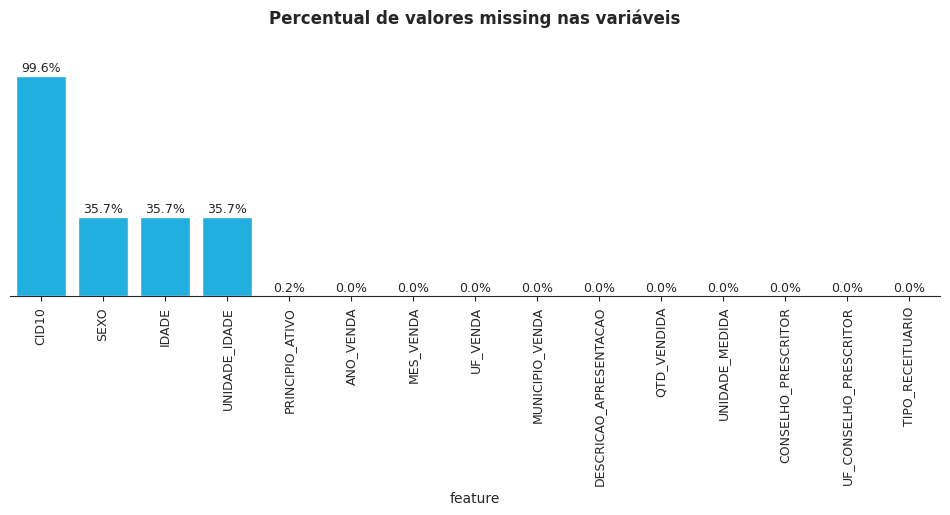

In [ ]:
# Exibindo gráfico de valores missing
plot_bar_2var(df_report, var_x='feature', var_y='perc miss', figsize=(12,3), title='Percentual de valores missing nas variáveis', unity='%')

**CID10:**
* Possui alto percentual de valores faltantes (99,6%), sendo assim, ela será inutilizada.

**PRINCIPIO_ATIVO:**
* Será imputado o valor da moda, já que a variável é do tipo categórica e isso impossibilita o cálculo de média ou mediana.


**SEXO:**
* Como o domínio só permite os valores 1 (para sexo masculino) e 2 (para sexo feminino), o valor imputado será a Moda da feature (valor de média ou mediana acarretaria em números decimais).


**IDADE e UNIDADE_IDADE:**
* Caso existam valores faltantes somente para a feature IDADE (quando há a unidade 'meses/anos', mas não há o valor da idade), o valor imputado será a Moda da idade em anos ou Moda da idade em meses (depedendo de qual é a unidade indicada)

* Caso existam valores faltantes somente para a feature UNIDADE_IDADE, valores maiores ou iguais a 12 serão considerados como sendo em 'anos' e
valores menores que 12 serão considerados como sendo em meses

* Caso IDADE e UNIDADE_IDADE possuam valores faltantes concomitantemente, será adotado a moda da idade naquela unidade que é mais representativa (que possui maior percentual de observações)

* Não se pode garantir que todas as instâncias com dados faltantes em IDADE são as mesmas com dados faltantes em UNIDADE_IDADE. Por isso as formas houve a divisão de tarefas acima.

###Ajuste dos dados

In [ ]:
# Deletando a coluna CID10
df.drop('CID10', axis=1, inplace=True)

# Imputando os valores para a feature PRINCIPIO_ATIVO
moda_princ = df['PRINCIPIO_ATIVO'].mode()[0]
df['PRINCIPIO_ATIVO'].fillna(moda_princ , inplace=True)

# Imputando os valores para a feature SEXO
moda_sexo = df['SEXO'].mode()[0]
df['SEXO'].fillna(moda_sexo , inplace=True)

In [ ]:
# Observações onde só a IDADE é faltante, mas a UNIDADE_IDADE é fornecida:
qtd = len(df[df['IDADE'].isna() & df['UNIDADE_IDADE'].notna()])
print(f'Existe(m) {qtd} caso(s) onde a IDADE é faltante mas a UNIDADE_IDADE é fornecida')

Existe(m) 0 caso(s) onde a IDADE é faltante mas a UNIDADE_IDADE é fornecida


In [ ]:
# Observações onde só a UNIDADE_IDADE é faltante, mas a IDADE é fornecida:
qtd = len(df[df['UNIDADE_IDADE'].isna() & df['IDADE'].notna()])
print(f'Existe(m) {qtd} caso(s) onde a UNIDADE_IDADE é faltante mas a IDADE é fornecida')

Existe(m) 0 caso(s) onde a UNIDADE_IDADE é faltante mas a IDADE é fornecida


In [ ]:
# Observações onde  UNIDADE_IDADE e IDADE são faltantes:
qtd = len(df[(df['IDADE'].isna()) & (df['UNIDADE_IDADE'].isna())])
print(f'Existe(m) {qtd} caso(s) onde a IDADE e UNIDADE_IDADE são faltantes')

Existe(m) 995525 caso(s) onde a IDADE e UNIDADE_IDADE são faltantes


Logo, em todas as observações onde IDADE é faltante, UNIDADE_IDADE também é.

Agora, será verificado qual a categoria de UNIDADE_IDADE que é mais representativa para que seja utilizada na imputação dos valores faltantes.

In [ ]:
#Ditribuição do tipo de unidade
df[['UNIDADE_IDADE']].value_counts()

UNIDADE_IDADE
1.0              1762766
2.0                27277
dtype: int64

A idade em anos é a mais representativa, logo, os valores de IDADE e UNIDADE_IDADE serão imputados com a medida de anos.

In [ ]:
# Imputando os valores para as features IDADE e UNIDADE_IDADE
moda_uni_idade = df.loc[df['IDADE']==1, 'IDADE'].mode()[0]  #calcula a moda
df['UNIDADE_IDADE'].fillna(1, inplace = True)               #preenche com o valor a categoria 1 (anos)
df['IDADE'].fillna(moda_uni_idade, inplace = True)          #preenche com o valor da moda da idade em anos

Todas as features com valores missing foram tratadas e agora é possível criar as colunas IDADE_ANOS e IDADE_MESES.

In [ ]:
# Criando a coluna IDADE_ANOS:

df['IDADE_ANOS'] = df['IDADE']
df['IDADE_ANOS'] = np.where(df['UNIDADE_IDADE'] == 1, df['IDADE_ANOS'], np.floor(df['IDADE_ANOS'] / 12))
#mantém a idade, se UNIDADE_IDADE for em anos, ou converte, se UNIDADE_IDADE for em meses

As features IDADE e UNIDADE_IDADE não se fazem mais necessárias.

In [ ]:
# Excluindo a variável UNIDADE_IDADE
df.drop('UNIDADE_IDADE', axis=1, inplace=True)
df.drop('IDADE', axis=1, inplace=True)

In [ ]:
# Convertendo a variável TIPO_RECEITUÁRIO para 'object'
df['TIPO_RECEITUARIO'] = df['TIPO_RECEITUARIO'].astype(object)

In [ ]:
# Convertendo a variável SEXO para categorias M e F
df.loc[df['SEXO']==1,'SEXO'] = 'M'
df.loc[df['SEXO']==2,'SEXO'] = 'F'

In [ ]:
# Verificando valores duplicados
dup = df.duplicated().sum()
tot = df.shape[0]
print(f'''Com os ajustes realizados, {dup} observações estão duplicadas,
o que corresponde a {round(100 * dup / tot , 3)}% do conjunto de dados.''')

Com os ajustes realizados, 3910 observações estão duplicadas,
o que corresponde a 0.14% do conjunto de dados.


###Análise descritiva / preliminar

In [ ]:
# Sumarização das variáveis numéricas
df.describe()

,ANO_VENDA,MES_VENDA,QTD_VENDIDA,IDADE_ANOS
count,2785568.0,2785568.0,2.785568e+06,2.785568e+06
mean,2021.0,11.0,4.136976e+00,2.639265e+01
std,0.0,0.0,6.705600e+02,3.832908e+01
min,2021.0,11.0,1.000000e+00,0.000000e+00
25%,2021.0,11.0,1.000000e+00,1.000000e+00
50%,2021.0,11.0,1.000000e+00,2.200000e+01
75%,2021.0,11.0,3.000000e+00,4.500000e+01
max,2021.0,11.0,7.898310e+05,9.990000e+02


In [ ]:
# Correlação entre variáveis numéricas
df.corr()

,ANO_VENDA,MES_VENDA,QTD_VENDIDA,IDADE_ANOS
ANO_VENDA,NaN,NaN,NaN,NaN
MES_VENDA,NaN,NaN,NaN,NaN
QTD_VENDIDA,NaN,NaN,1.000000,-0.002312
IDADE_ANOS,NaN,NaN,-0.002312,1.000000


**Ano de venda**:
* Somente 2021

**Mês de venda**:
* Somente novembro

**Quantidade vendida**:
* Mínimo de 1 e máximo de 789831 unidades, onde o percentil 75% equivale a 3 unidades, o que indica presença de valores discrepantes. Porém, a comparação ainda não é possível, pois existem unidades de medida diferentes para esta variável.

**Idade em anos**:
* 75% das observações possuem até 55 anos, sendo a mediana igual a 38 anos. O valor máximo indicado é de 999 anos e pode ser entendido como erro de imputação (por falta de dados ou por erro de digitação). Assim, para esta variável será aplicado um filtro nas visualizações, limitando o público a um certo intervalo.

**Correlaçãoentre variáveis numéricas**:
* Não há correlação entre a quantidade vendida e a idade do paciente

In [ ]:
# Sumarização das variáveis categóricas
df.select_dtypes(include='object').describe()

,UF_VENDA,MUNICIPIO_VENDA,PRINCIPIO_ATIVO,DESCRICAO_APRESENTACAO,UNIDADE_MEDIDA,CONSELHO_PRESCRITOR,UF_CONSELHO_PRESCRITOR,TIPO_RECEITUARIO,SEXO
count,2785568,2785568,2785568,2785568,2785568,2785568,2785568,2785568.0,2785568
unique,27,4625,661,3681,2,4,27,5.0,2
top,SP,SÃO PAULO,AZITROMICINA DI-HIDRATADA,500 MG CAP DURA CT BL AL PLAS TRANS X 21,CAIXA,CRM,SP,5.0,F
freq,585811,64833,181999,88157,2321681,2519364,590764,1556696.0,1984519


**UF_VENDA**:
* o Estado de São Paulo é o de maior frequência, o que pode ser explicado pelo fato de ser o estado mais populoso.

**MUNICIPIO_VENDA**:
* A cidade de São Paulo é a de maior frequência, o que pode ser explicado pelo fato de ser a cidade mais populosa.


###Análise unidimensional - variáveis numéricas

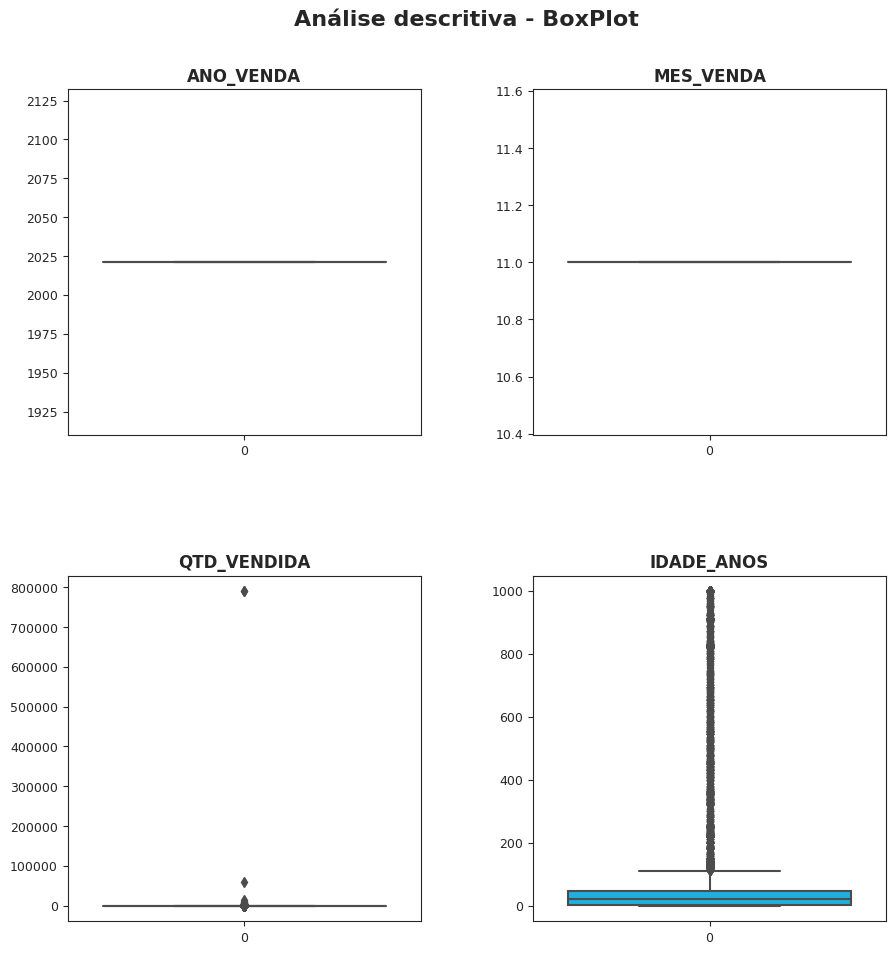

In [ ]:
# Boxplot das variáveis numéricas
plot_batch_boxplot(df, cols=2, pad=50, b=10)

**ANO_VENDA e MES_VENDA**:
* Possuem valores únicos, conforme já demonstrado.

**QTD_VENDIDA**:
* Se concentra em valores baixos (baixa variabilidade), próximos de Zero, mas há valores muito discrepantes que, provavelmente, são originados de erros de imputação.

**IDADE_ANOS**:
* Possui mediana igual a 38 anos, conforme demonstrado anteriormente. Porém, existem outliers na distribuição, indicando erros de imputação.

Para a visualização dos histogramas das variáveis, os outliers (valores discrepantes), serão desconsiderados.

As instâncias (linhas) onde há ou outliers não serão removidas, e sim, somente o valor discrepante em cada instância.

In [ ]:
# Criando um dataset sem outliers das observações
df_aux = replace_outliers(df)

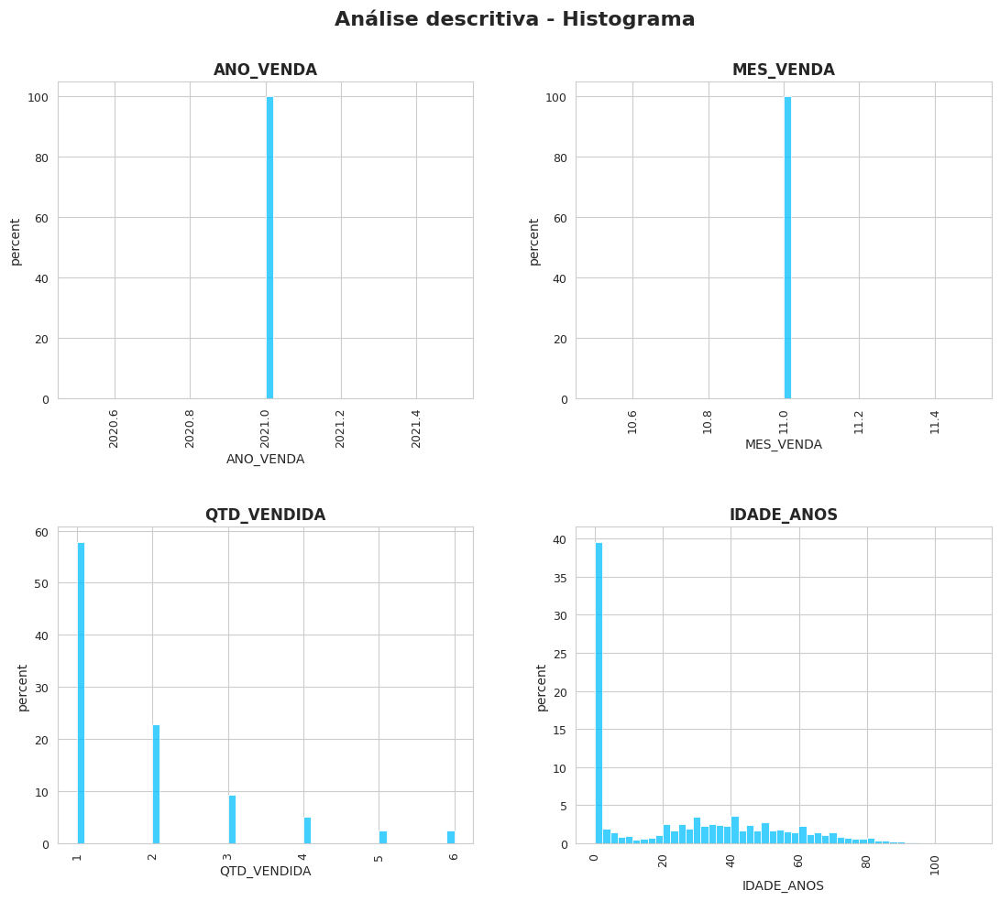

In [ ]:
# Histograma das variáveis numéricas sem outliers
plot_batch_histogram(df_aux, bins=50, grid=True, stat='percent' , cols=2, b=12)

**QTD_VENDIDA**:
* Mais da metade das vendas (quase 60%) é de somente 1 (uma) unidade por venda.

**IDADE_ANOS**:
* Quase 40% das vendas são para pacientes com até 1 ano de idade. O que indica que mães/pais/responsáveis por bebês são o maior público. O público acima de 40 anos, aproximadamente, começa a decair no percentual de vendas.

###Análise unidimensional - variáveis categóricas

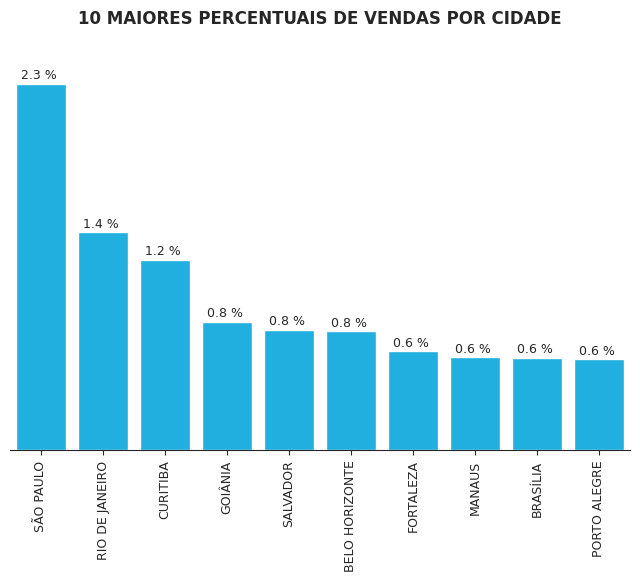

In [ ]:
plot_bar(df, 'MUNICIPIO_VENDA', figsize=(8,5), txt_rot='h', dist=0.01, title='10 MAIORES PERCENTUAIS DE VENDAS POR CIDADE', top=10)

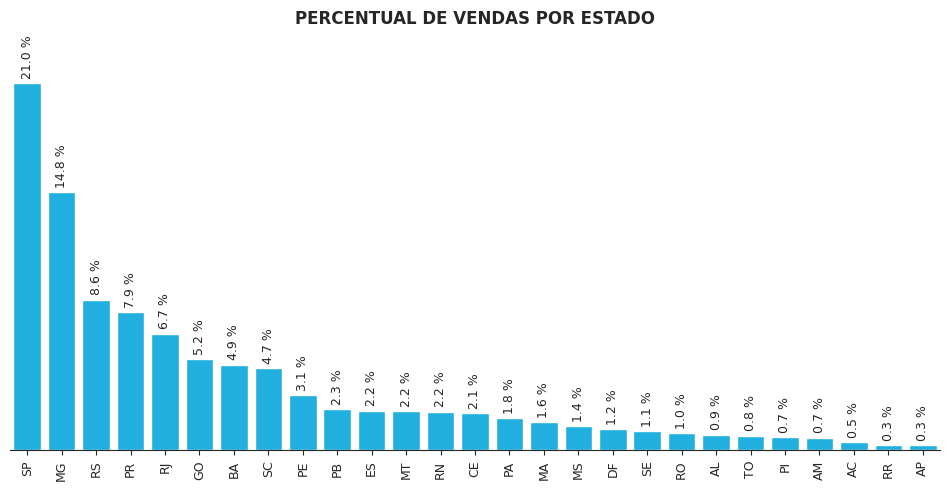

In [ ]:
plot_bar(df, 'UF_VENDA', figsize=(12,5), txt_rot='v', dist=0.3, title='PERCENTUAL DE VENDAS POR ESTADO')

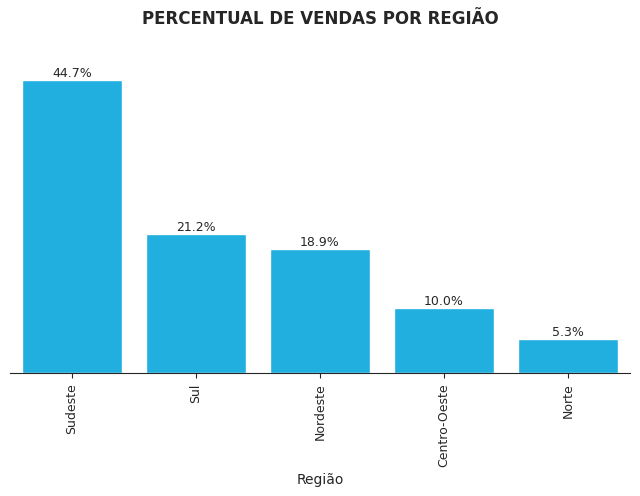

In [ ]:
# Dicionário para agrupar as regiões
estado_regiao = {
    'AC': 'Norte', 'AL': 'Nordeste', 'AP': 'Norte', 'AM': 'Norte', 'BA': 'Nordeste', 'CE': 'Nordeste',
    'DF': 'Centro-Oeste','ES': 'Sudeste','GO': 'Centro-Oeste','MA': 'Nordeste','MT': 'Centro-Oeste',
    'MS': 'Centro-Oeste','MG': 'Sudeste','PA': 'Norte','PB': 'Nordeste','PR': 'Sul','PE': 'Nordeste',
    'PI': 'Nordeste','RJ': 'Sudeste','RN': 'Nordeste','RS': 'Sul','RO': 'Norte','RR': 'Norte',
    'SC': 'Sul','SP': 'Sudeste','SE': 'Nordeste','TO': 'Norte'}

# Crie o DataFrame auxiliar df_aux apenas com as colunas "Região" e "Percentual de vendas".
df_aux = pd.DataFrame(columns=['Região', '% Vendas'])

# Calcule o total de vendas por região.
total_por_regiao = df['UF_VENDA'].map(estado_regiao).value_counts().reset_index()
total_por_regiao.columns = ['Região', 'Total_Vendas']

# Calcule o percentual de vendas por região.
total_vendas_total = df.shape[0]
total_por_regiao['% Vendas'] = (total_por_regiao['Total_Vendas'] / total_vendas_total) * 100

# Atualize o DataFrame df_aux com as informações de vendas por região.
df_aux['Região'] = total_por_regiao['Região']
df_aux['% Vendas'] = total_por_regiao['% Vendas']

# plota o gráfico
plot_bar_2var(df_aux, var_x = 'Região', var_y= '% Vendas', figsize = (8,4), unity='%', dist = 0.1, title='PERCENTUAL DE VENDAS POR REGIÃO')

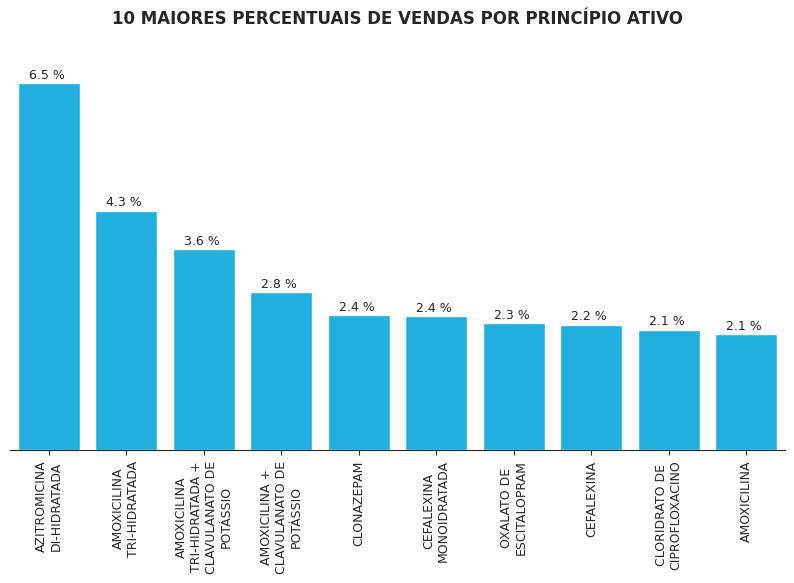

In [ ]:
plot_bar(df, 'PRINCIPIO_ATIVO', figsize=(10,5), txt_rot='h', dist=0.04, title='10 MAIORES PERCENTUAIS DE VENDAS POR PRINCÍPIO ATIVO', top=10)

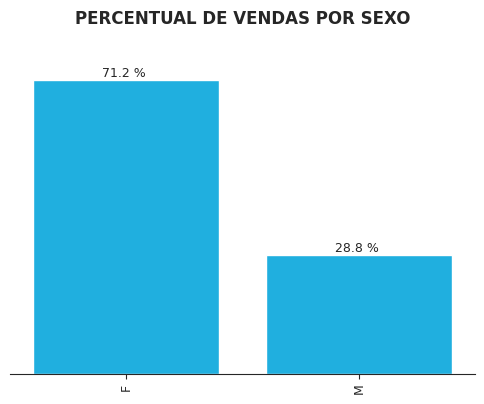

In [ ]:
plot_bar(df, 'SEXO', figsize=(6,4), txt_rot='h', dist=0.04, title='PERCENTUAL DE VENDAS POR SEXO')

**MUNICPIO_VENDA**:
* São Paulo, Rio de Janeiro e Curitiba são as cidades com maior participação nas vendas de nov/2021, respectivamente.

**UF_VENDA**:
* São Paulo, Minas Gerais e Rio Grande do Sul são os estados com maiores participações nas vendas de nov/2021, respectivamente.

**REGIÃO DE VENDA**:
* A distribuição das vendas é encabeçada pela região Sudeste, que é a mais populosa do País. Em segundo, está a região Sul que, mesmo sendo menos populosa que o Nordeste, apresenta maior consumo de medicamentos. A região Norte é a de menor representação nas vendas.

**PRINCIPIO_ATIVO**:
* Azitromicina di-hidratada é o princípio ativo com maior percentual de vendas. Isto pode estar relacionado com a disseminação da informação de que este componente pode surtir efeitos, sem comprovação cietífica, no tratamento precoce da Covid-19, visto que em Novembro de 2021 ainda ocorriam grandes volumes de casos.

* Amoxicilina aparece 4 vezes no ranking dos 10 princípios ativos mais vendidos, o que pode indicar um percentual maior de doenças de origem bacteriana acometendo a população.

* Clonazepam é o princípio ativo que ocupa a 5ª posição nas vendas. É um medicamento ansiolítico e sua presença no ranking de maiores vendas pode indicar um alto índice da populção enfrentando problemas com ansiedade, principalmente se for levado em conta o período de observação das vendas, novembro de 2021, ao qual ainda ocorriam restrições sociais por conta da Covid-19.

* Cefalexina aparece 2 vezes no ranking. É um medicamento utilizando no combate à infecções bacterianas respiratórias, na pele, no trato urinário e infecções ósseas/articulares.

* Oxalato de escitalopram ocupa a 7ª posição e é um medicamento utilizado no tratamento e prevenção de recaída de depressão e/ou transtorno de pânico. Sua presença no ranking pode reforçar o pressuposto feito para o Clonazepam, que é um alto índice da população enfrentando problemas mentais.

* Cloridrato de ciprofloxacino ocupa a 9ª posição e é um medicamento utilizado no combate a infecções bacterianas abdominais, de pele, no trato urinário, nos ossos, nas articulações e até as broncopulmonares.

* Excluindo a Azitromicina, que pode ter sua venda influenciada por falsas informações, dos 9 principios ativos restantes, 7 são medicamentos antibióticos e 2 são medicamentos para trato de doenças mentais.

**SEXO**:
* A maioria das vendas são feitas para o sexo feminino e este fato pode indicar a maior preocupação com a saúde por parte das mulheres.

###Análise bidimensional - categórica x categórica

In [ ]:
# PRINCIPIO ATIVO MAIS VENDIDO POR REGIÃO

# Agrupe o DataFrame por estado (UF_VENDA) e princípio ativo (Principio_Ativo) e calcule o total de vendas.
agrupado = df.groupby(['UF_VENDA', 'PRINCIPIO_ATIVO']).size().reset_index(name='Quantidade_Vendida')

# Calcule o total de vendas por estado.
total_vendas_por_estado = df.groupby('UF_VENDA').size().reset_index(name='Total_Vendas')

# Junte os DataFrames agrupado e total_vendas_por_estado pelo estado (UF_VENDA).
agrupado = agrupado.merge(total_vendas_por_estado, on='UF_VENDA')

# Calcule o percentual de vendas para cada linha.
agrupado['Percentual_Vendido'] = round(100 * (agrupado['Quantidade_Vendida'] / agrupado['Total_Vendas']) , 1)
# Encontre o índice do máximo de vendas para cada estado.
idx = agrupado.groupby(['UF_VENDA'])['Percentual_Vendido'].transform(max) == agrupado['Percentual_Vendido']

# Selecione as linhas correspondentes aos princípios ativos mais vendidos por estado.
principio_ativo_mais_vendido = agrupado[idx]

# Dropando colunas desnecessárias
principio_ativo_mais_vendido = principio_ativo_mais_vendido.drop(['Quantidade_Vendida','Total_Vendas'], axis=1)

# Visualização dos dados
principio_ativo_mais_vendido

,UF_VENDA,PRINCIPIO_ATIVO,Percentual_Vendido
191,AC,SULFAMETOXAZOL + TRIMETOPRIMA,6.0
238,AL,AZITROMICINA DI-HIDRATADA,5.1
487,AM,AZITROMICINA DI-HIDRATADA,6.1
728,AP,AZITROMICINA DI-HIDRATADA,7.8
939,BA,AZITROMICINA DI-HIDRATADA,5.2
1240,CE,AZITROMICINA DI-HIDRATADA,4.9
1511,DF,AZITROMICINA DI-HIDRATADA,5.9
1804,ES,AZITROMICINA DI-HIDRATADA,6.9
2098,GO,AZITROMICINA DI-HIDRATADA,6.1
2437,MA,AZITROMICINA DI-HIDRATADA,5.6


In [ ]:
# PRINCIPIO ATIVO MAIS VENDIDO POR IDADE

# Criando dataset sem outliers
df_aux = replace_outliers(df)

# Filtrando a idade (0 a 80 anos)
df_aux = df_aux[df_aux['IDADE_ANOS']<= 80]

# Agrupe o DataFrame por idade (IDADE) e princípio ativo (Principio_Ativo) e conte as vendas.
agrupado = df_aux.groupby(['IDADE_ANOS', 'PRINCIPIO_ATIVO']).size().reset_index(name='Quantidade_Vendida')

# Encontre o índice do máximo de vendas para cada grupo de idade.
idx = agrupado.groupby(['IDADE_ANOS'])['Quantidade_Vendida'].transform(max) == agrupado['Quantidade_Vendida']

# Selecione as linhas correspondentes aos princípios ativos mais vendidos por grupo de idade.
principio_ativo_mais_vendido_por_idade = agrupado[idx]

# Ordenando o dataframe.
principio_ativo_mais_vendido_por_idade = principio_ativo_mais_vendido_por_idade.sort_values('IDADE_ANOS')

# Exibindo o dataframe agrupado por Principio ativo
principio_ativo_mais_vendido_por_idade.groupby(['PRINCIPIO_ATIVO','IDADE_ANOS']).size()


PRINCIPIO_ATIVO            IDADE_ANOS
AZITROMICINA DI-HIDRATADA  0.0           1
                           2.0           1
                           3.0           1
                           4.0           1
                           5.0           1
                                        ..
                           77.0          1
                           78.0          1
                           79.0          1
                           80.0          1
CLONAZEPAM                 1.0           1
Length: 81, dtype: int64

In [ ]:
# Percentuis
principio_ativo_mais_vendido_por_idade['PRINCIPIO_ATIVO'].value_counts(1)

AZITROMICINA DI-HIDRATADA    0.987654
CLONAZEPAM                   0.012346
Name: PRINCIPIO_ATIVO, dtype: float64

In [ ]:
# PRINCIPIO ATIVO MAIS VENDIDO POR SEXO

# Criando dataset sem outliers
df_aux = replace_outliers(df)

# Agrupe o DataFrame por idade (IDADE) e princípio ativo (Principio_Ativo) e conte as vendas.
agrupado = df_aux.groupby(['SEXO', 'PRINCIPIO_ATIVO']).size().reset_index(name='Quantidade_Vendida')

# Encontre o índice do máximo de vendas para cada grupo de idade.
idx = agrupado.groupby(['SEXO'])['Quantidade_Vendida'].transform(max) == agrupado['Quantidade_Vendida']

# Selecione as linhas correspondentes aos princípios ativos mais vendidos por grupo de idade.
principio_ativo_mais_vendido_por_idade = agrupado[idx]

# Exiba o DataFrame com os princípios ativos mais vendidos por idade.
principio_ativo_mais_vendido_por_idade

,SEXO,PRINCIPIO_ATIVO,Quantidade_Vendida
73,F,AZITROMICINA DI-HIDRATADA,95303
679,M,AZITROMICINA DI-HIDRATADA,86696


* A Azitromicina di-hidratada é o princípio ativo mais vendido em todos os estados com esxcessão do Acree do Pernambuco. No Acre, o princípio ativo mais vendido é o Sulfametoxazol + Trimetroprima e no Pernambuco é o Clonazepam.

* A Azitomicina di-hidratada é o princípio ativo mais vendido entre todas as idades, com excessão para pacientes de 1 anos de idade. Para estes pacientes, o Clonazepan é o princípio ativo mais vendido.

* Para ambos os sexos, a Azitromicina di-hidratada é o princípio ativo mais vendido.

###Análise geográfica por cidade

In [ ]:
# Agrupando o DataFrame por 'MUNICIPIO_VENDA' e calculando a soma das vendas
df_grouped = df.groupby('MUNICIPIO_VENDA')['QTD_VENDIDA'].size().reset_index()

# Filtrar o DataFrame para cidades com mais de 1500 vendas
df_filtered = df_grouped[df_grouped['QTD_VENDIDA'] > 1500]

# Definir limites geográficos do Brasil (latitude e longitude)
lat_min, lat_max = -35.0, 5.0
lon_min, lon_max = -75.0, -34.0

# Inicializar o objeto Nominatim
geolocator = Nominatim(user_agent="city_locator")

# Criar uma função para remover acentos e caracteres especiais de uma string
def remove_accents(input_str):
    nfkd_form = unicodedata.normalize('NFKD', input_str)
    return ''.join([c for c in nfkd_form if not unicodedata.combining(c)])

# Criar uma função para obter as coordenadas de uma cidade com caracteres especiais e acentos removidos
def get_coordinates(city_name):
    city_name_cleaned = remove_accents(city_name)  # Remove acentos e caracteres especiais
    location = None
    while not location:
        try:
            location = geolocator.geocode(city_name_cleaned)
        except Exception as e:
            print(f"Erro ao obter coordenadas para {city_name_cleaned}: {str(e)}")
            time.sleep(2)  # Esperar 2 segundos antes de tentar novamente

    # Verificar se as coordenadas estão dentro dos limites do Brasil
    if lat_min <= location.latitude <= lat_max and lon_min <= location.longitude <= lon_max:
        return (location.latitude, location.longitude)
    else:
        return None

# Adicionar as coordenadas ao DataFrame filtrado
df_filtered['COORDENADAS'] = df_filtered['MUNICIPIO_VENDA'].apply(lambda x: get_coordinates(x))

# Criar um mapa Folium centrado em uma localização com título
m = folium.Map(location=[-15.788497, -47.879873], zoom_start=4, title='Vendas por cidade (acima de 1500 vendas)')

# Iterar sobre as cidades filtradas e adicionar marcadores ao mapa
for index, row in df_filtered.iterrows():
    city = row['MUNICIPIO_VENDA']
    sales_total = row['QTD_VENDIDA']
    coordinates = row['COORDENADAS']

    if coordinates:
        lat, lon = coordinates
        tooltip = f'Cidade: {city}\nTotal de Vendas: {sales_total}'
        folium.Marker(
            location=[lat, lon],
            tooltip=tooltip,
            icon=folium.Icon(color='blue', icon='info-sign')
        ).add_to(m)

# Exibir o mapa por cidade
m

In [ ]:
# Exportando o mapa
m.save('Venda por cidade.html')

* O mapa acima traz informações por cidade, de forma a entender a quantidade de vendas em cidades específicas.
* Somente são exibidas as cidades com vendas acima de 1500 unidades

###Análise geográfica por estado

In [ ]:
# VENDA POR ESTADO

# Carregue o arquivo GeoJSON especificando a codificação correta (ISO-8859-1)
with open("/content/drive/MyDrive/Colab Notebooks/Projetos pessoais/01. Projetos Machine Learning/Vendas farmacêuticas [PoD]/uf.json", encoding="ISO-8859-1") as geojson_data:
    geojson = json.load(geojson_data)

# Função para definir a cor com base em alguma lógica (aqui, estamos usando aleatoriamente)
def assign_random_color(feature):
    import random
    return {
        'fillColor': f"#{random.randint(0, 0xFFFFFF):06x}",  # Gera uma cor hexadecimal aleatória
        'color': 'black',  # Cor da borda
        'weight': 1,       # Espessura da borda
        'fillOpacity': 0.6 # Opacidade do preenchimento
    }

# Crie um objeto de mapa centrado nas coordenadas médias do GeoJSON (para visualização)
mapa_est = folium.Map(location=[-15.788, -47.879], zoom_start=5)  # Defina o zoom e a localização iniciais
folium.GeoJson(geojson, style_function=assign_random_color).add_to(mapa_est)

# Função para calcular o total de vendas por estado com base no DataFrame 'df'
def calcular_total_vendas_por_estado(df):
    total_vendas_por_estado = df.groupby('UF_VENDA').size().reset_index(name='TOTAL_VENDAS')
    return total_vendas_por_estado

# Calcule o total de vendas por estado com base em 'df'
total_vendas_por_estado = calcular_total_vendas_por_estado(df)

# Função para determinar as coordenadas do centro de cada estado
def coordenadas_centro_por_estado():
    coordenadas = {
        'AC': [-8.77, -70.55],
        'AL': [-9.71, -35.73],
        'AP': [1.41, -51.77],
        'AM': [-3.47, -65.10],
        'BA': [-12.96, -38.50],
        'CE': [-3.71, -38.54],
        'DF': [-15.78, -47.93],
        'ES': [-19.19, -40.34],
        'GO': [-16.64, -49.31],
        'MA': [-2.55, -44.30],
        'MT': [-12.64, -55.42],
        'MS': [-20.51, -54.54],
        'MG': [-18.10, -44.38],
        'PA': [-5.53, -52.29],
        'PB': [-7.06, -35.55],
        'PR': [-24.89, -51.55],
        'PE': [-8.28, -35.07],
        'PI': [-8.28, -43.68],
        'RJ': [-22.84, -43.15],
        'RN': [-5.22, -36.52],
        'RS': [-30.01, -51.22],
        'RO': [-10.83, -63.34],
        'RR': [1.99, -61.33],
        'SC': [-27.59, -48.55],
        'SP': [-23.55, -46.63],
        'SE': [-10.98, -37.07],
        'TO': [-9.96, -47.34]
    }
    return coordenadas

# Função para adicionar marcadores com informações de total de vendas por estado
def add_markers():
    coordenadas = coordenadas_centro_por_estado()
    for index, row in total_vendas_por_estado.iterrows():
        estado = row['UF_VENDA']
        total_vendas = row['TOTAL_VENDAS']
        coords = coordenadas.get(estado)
        if coords:
            popup_text = f"<div style='font-size: 16px;'>ESTADO: {estado}<br><br>TOTAL DE VENDAS: {total_vendas}"
            folium.Marker(
                location=coords,
                popup=folium.Popup(popup_text , max_width= 800)
            ).add_to(mapa_est)

# Adicione os marcadores ao mapa
add_markers()

# Exiba o mapa por estado
mapa_est

In [ ]:
# Exportando o mapa em html
mapa_est.save('Venda por estado.html')

In [ ]:
# PRINCIPIO ATIVO POR ESTADO (3 MAIORES)

# Carregue o arquivo GeoJSON especificando a codificação correta (ISO-8859-1)
with open("/content/drive/MyDrive/Colab Notebooks/Projetos pessoais/01. Projetos Machine Learning/Vendas farmacêuticas [PoD]/uf.json", encoding="ISO-8859-1") as geojson_data:
    geojson = json.load(geojson_data)

# Função para definir a cor com base em alguma lógica (aqui, estamos usando aleatoriamente)
def assign_random_color(feature):
    import random
    return {
        'fillColor': f"#{random.randint(0, 0xFFFFFF):06x}",  # Gera uma cor hexadecimal aleatória
        'color': 'black',  # Cor da borda
        'weight': 1,       # Espessura da borda
        'fillOpacity': 0.6 # Opacidade do preenchimento
    }

# Crie um objeto de mapa centrado nas coordenadas médias do GeoJSON (para visualização)
mapa_est = folium.Map(location=[-15.788, -47.879], zoom_start=5)  # Defina o zoom e a localização iniciais
folium.GeoJson(geojson, style_function=assign_random_color).add_to(mapa_est)

# Função para calcular os três principais princípios ativos mais vendidos por estado com base no DataFrame 'df'
def calcular_principios_ativos_mais_vendidos_por_estado(df):
    # Agrupe os princípios ativos por estado e conte as ocorrências de cada um
    principios_ativos_por_estado = df.groupby(['UF_VENDA', 'PRINCIPIO_ATIVO'])['PRINCIPIO_ATIVO'].count().reset_index(name='TOTAL_VENDAS')

    # Ordene o DataFrame para cada estado pelos princípios ativos mais vendidos
    principios_ativos_por_estado = principios_ativos_por_estado.sort_values(by=['UF_VENDA', 'TOTAL_VENDAS'], ascending=[True, False])

    # Calcule o total de vendas por estado
    total_vendas_por_estado = principios_ativos_por_estado.groupby('UF_VENDA')['TOTAL_VENDAS'].sum().reset_index(name='TOTAL_VENDAS_ESTADO')

    # Junte o DataFrame dos princípios ativos com o total de vendas por estado
    principios_ativos_por_estado = principios_ativos_por_estado.merge(total_vendas_por_estado, on='UF_VENDA')

    # Calcule o percentual de vendas para cada princípio ativo em relação ao total de vendas por estado
    principios_ativos_por_estado['PERCENTUAL_VENDAS'] = (
        (principios_ativos_por_estado['TOTAL_VENDAS'] / principios_ativos_por_estado['TOTAL_VENDAS_ESTADO']) * 100
    )

    # Crie um novo DataFrame para armazenar os três principais princípios ativos por estado
    top_principios_ativos_por_estado = principios_ativos_por_estado.groupby('UF_VENDA').head(3)

    return top_principios_ativos_por_estado

# Calcule os três principais princípios ativos mais vendidos por estado com base em 'df'
top_principios_ativos_por_estado = calcular_principios_ativos_mais_vendidos_por_estado(df)

# Função para determinar as coordenadas do centro de cada estado
def coordenadas_centro_por_estado():
    coordenadas = {
        'AC': [-8.77, -70.55],
        'AL': [-9.71, -35.73],
        'AP': [1.41, -51.77],
        'AM': [-3.47, -65.10],
        'BA': [-12.96, -38.50],
        'CE': [-3.71, -38.54],
        'DF': [-15.78, -47.93],
        'ES': [-19.19, -40.34],
        'GO': [-16.64, -49.31],
        'MA': [-2.55, -44.30],
        'MT': [-12.64, -55.42],
        'MS': [-20.51, -54.54],
        'MG': [-18.10, -44.38],
        'PA': [-5.53, -52.29],
        'PB': [-7.06, -35.55],
        'PR': [-24.89, -51.55],
        'PE': [-8.28, -35.07],
        'PI': [-8.28, -43.68],
        'RJ': [-22.84, -43.15],
        'RN': [-5.22, -36.52],
        'RS': [-30.01, -51.22],
        'RO': [-10.83, -63.34],
        'RR': [1.99, -61.33],
        'SC': [-27.59, -48.55],
        'SP': [-23.55, -46.63],
        'SE': [-10.98, -37.07],
        'TO': [-9.96, -47.34]
    }
    return coordenadas

# Função para adicionar marcadores com informações dos três principais princípios ativos por estado
def add_markers():
    coordenadas = coordenadas_centro_por_estado()
    for estado, principios_ativos in top_principios_ativos_por_estado.groupby('UF_VENDA'):
        coords = coordenadas.get(estado)
        if coords:
            popup_text = f"""<div style='font-size: 16px;'>
                                ESTADO: {estado}<br><br>
                                PRINCÍPIO ATIVO E PERCENTUAL DE VENDA:<br><br>
                                <ul style='list-style-type: none; padding: 0; margin: 0;">
                                """
            popup_text += "".join([f"""<li>• {row['PRINCIPIO_ATIVO']} ({row['PERCENTUAL_VENDAS']:.2f}%)</li>""" for i, row in principios_ativos.iterrows()])
            popup_text += "</ul></div>"
            folium.Marker(
                location=coords,  # Usar as coordenadas do centro do estado
                popup=folium.Popup(popup_text, max_width=800),  # Defina uma largura máxima para o pop-up
                tooltip=estado,
                icon=folium.Icon(color='blue', icon='info-sign', prefix='glyphicon')
            ).add_to(mapa_est)

# Adicione os marcadores ao mapa
add_markers()

# Exiba o mapa
mapa_est


In [ ]:
# Exportando o mapa em html
mapa_est.save('Principio ativo por estado.html')

* Os mapas permitem entender melhor a distribuição das vendas por princípio ativo. Azitromicina e Amoxicilina são o principais princípios ativos na grande maioria dos estados.

* Em alguns estados do nordeste, o Clonazepam aparece como um dos principais princípios ativos vendidos, o que indica uma tendência de consumo deste medicamento nesta região.

* No estado do Piauí chama a atenção o fato de que dois dos principais medicamentos vendidos são para tratamento de doenças mentais (Clonazepam e Oxilato de escitalopram), o que pode indicar um alto percentual da população acometida por tais doenças.

* No estados do Acre, Amapá e Maranhão, ocorre a presença do Sulfametoxazol + Trimetroprima dentre os mais vendidos.

###Análise geográfica por região

In [ ]:
# PERCENTUAL DE VENDAS POR REGIÃO

# Carregue o arquivo GeoJSON especificando a codificação correta (ISO-8859-1)
with open("/content/drive/MyDrive/Colab Notebooks/Projetos pessoais/01. Projetos Machine Learning/Vendas farmacêuticas [PoD]/uf.json", encoding="ISO-8859-1") as geojson_data:
    geojson = json.load(geojson_data)

# Função para definir a cor com base na região (usando "REGIAO" como atributo)
def assign_color_by_region(feature):
    regiao = feature['properties']['REGIAO']  # Atualizado para o nome correto do atributo
    # Defina cores diferentes para cada região
    cores_por_regiao = {
        'Norte': 'blue',
        'Nordeste': 'red',
        'Sudeste': 'green',
        'Sul': 'orange',
        'Centro-Oeste': 'purple'
    }
    return {
        'fillColor': cores_por_regiao.get(regiao, 'gray'),
        'color': 'black',  # Cor da borda
        'weight': 1,       # Espessura da borda
        'fillOpacity': 0.6 # Opacidade do preenchimento
    }

# Adicione o GeoJSON ao mapa, definindo a função de estilo
mapa = folium.Map(location=[-15.788, -47.879], zoom_start=5)  # Defina o zoom e a localização iniciais
folium.GeoJson(geojson, style_function=assign_color_by_region).add_to(mapa)

# Carregue o DataFrame 'df' com seus dados
# Substitua esta parte pelo carregamento real do DataFrame 'df'
# Exemplo: df = pd.read_csv('seuarquivo.csv')

# Função para calcular o percentual de vendas por região com base no DataFrame 'df'
def calcular_percentual_vendas_por_regiao(df):
    # Crie um mapeamento de UF para região (substitua 'UF' e 'REGIAO' pelos nomes corretos de colunas)
    uf_regiao = {
        'AC': 'Norte',
        'AL': 'Nordeste',
        'AP': 'Norte',
        'AM': 'Norte',
        'BA': 'Nordeste',
        'CE': 'Nordeste',
        'DF': 'Centro-Oeste',
        'ES': 'Sudeste',
        'GO': 'Centro-Oeste',
        'MA': 'Nordeste',
        'MT': 'Centro-Oeste',
        'MS': 'Centro-Oeste',
        'MG': 'Sudeste',
        'PA': 'Norte',
        'PB': 'Nordeste',
        'PR': 'Sul',
        'PE': 'Nordeste',
        'PI': 'Nordeste',
        'RJ': 'Sudeste',
        'RN': 'Nordeste',
        'RS': 'Sul',
        'RO': 'Norte',
        'RR': 'Norte',
        'SC': 'Sul',
        'SP': 'Sudeste',
        'SE': 'Nordeste',
        'TO': 'Norte'
    }

    # Adicione uma coluna de região ao DataFrame 'df'
    df['REGIAO'] = df['UF_VENDA'].map(uf_regiao)

    # Agregue as vendas por região
    vendas_por_regiao = df.groupby('REGIAO').size().reset_index(name='TOTAL_VENDAS')

    # Calcule o total geral de vendas
    total_geral_vendas = vendas_por_regiao['TOTAL_VENDAS'].sum()

    # Calcule o percentual de vendas por região
    vendas_por_regiao['PERCENTUAL_VENDAS'] = (vendas_por_regiao['TOTAL_VENDAS'] / total_geral_vendas) * 100

    return vendas_por_regiao

# Calcule o percentual de vendas por região com base em 'df'
percentual_vendas_por_regiao = calcular_percentual_vendas_por_regiao(df)

# Função para determinar as coordenadas do centro de cada região
def coordenadas_centro_por_regiao():
    coordenadas = {
        'Norte': [-3.4653, -62.2159],
        'Nordeste': [-9.6502, -37.7397],
        'Sudeste': [-21.9969, -43.2067],
        'Sul': [-27.5954, -48.5480],
        'Centro-Oeste': [-15.7801, -47.9292]
    }
    return coordenadas

# Função para adicionar marcadores com informações de percentual de vendas por região
def add_markers():
    coordenadas = coordenadas_centro_por_regiao()
    for index, row in percentual_vendas_por_regiao.iterrows():
        regiao = row['REGIAO']
        percentual_vendas = row['PERCENTUAL_VENDAS']
        coords = coordenadas.get(regiao)
        if coords:
            popup_text = f"<div style=' font-size: 16px;'>REGIÃO: {regiao}<br>PERCENTUAL DE VENDAS: {percentual_vendas:.2f}%"
            folium.Marker(coords, tooltip=regiao, popup=folium.Popup(popup_text , max_width=800)).add_to(mapa)

# Adicione os marcadores ao mapa
add_markers()

# Exibindo o mapa por percentual de vendas por região
mapa


In [ ]:
# Exportando o mapa em html
mapa.save('Venda por regiao.html')

In [ ]:
# PRINCIPIO ATIVO POR REGIÃO

# Carregue o arquivo GeoJSON especificando a codificação correta (ISO-8859-1)
with open("/content/drive/MyDrive/Colab Notebooks/Projetos pessoais/01. Projetos Machine Learning/Vendas farmacêuticas [PoD]/uf.json", encoding="ISO-8859-1") as geojson_data:
    geojson = json.load(geojson_data)

# Função para definir a cor com base na região (usando "REGIAO" como atributo)
def assign_color_by_region(feature):
    regiao = feature['properties']['REGIAO']
    # Defina cores diferentes para cada região
    cores_por_regiao = {
        'Norte': 'blue',
        'Nordeste': 'red',
        'Sudeste': 'green',
        'Sul': 'orange',
        'Centro-Oeste': 'purple'
    }
    return {
        'fillColor': cores_por_regiao.get(regiao, 'gray'),
        'color': 'black',  # Cor da borda
        'weight': 1,       # Espessura da borda
        'fillOpacity': 0.6 # Opacidade do preenchimento
    }

# Adicione o GeoJSON ao mapa, definindo a função de estilo
mapa = folium.Map(location=[-15.788, -47.879], zoom_start=5)  # Defina o zoom e a localização iniciais
folium.GeoJson(geojson, style_function=assign_color_by_region).add_to(mapa)


# Função para calcular o percentual de vendas de cada princípio ativo por região
def calcular_percentual_de_vendas(df):
    df_copy = df.copy()  # Crie uma cópia do DataFrame original

    # Crie um mapeamento de UF para região (substitua 'UF' e 'REGIAO' pelos nomes corretos de colunas)
    uf_regiao = {
        'AC': 'Norte',
        'AL': 'Nordeste',
        'AP': 'Norte',
        'AM': 'Norte',
        'BA': 'Nordeste',
        'CE': 'Nordeste',
        'DF': 'Centro-Oeste',
        'ES': 'Sudeste',
        'GO': 'Centro-Oeste',
        'MA': 'Nordeste',
        'MT': 'Centro-Oeste',
        'MS': 'Centro-Oeste',
        'MG': 'Sudeste',
        'PA': 'Norte',
        'PB': 'Nordeste',
        'PR': 'Sul',
        'PE': 'Nordeste',
        'PI': 'Nordeste',
        'RJ': 'Sudeste',
        'RN': 'Nordeste',
        'RS': 'Sul',
        'RO': 'Norte',
        'RR': 'Norte',
        'SC': 'Sul',
        'SP': 'Sudeste',
        'SE': 'Nordeste',
        'TO': 'Norte'
    }

    # Adicione uma coluna de região ao DataFrame 'df_copy'
    df_copy['REGIAO'] = df_copy['UF_VENDA'].map(uf_regiao)

    # Calcular o total de vendas por região
    total_vendas_por_regiao = df_copy.groupby('REGIAO').size().reset_index(name='TOTAL_VENDAS')

    # Calcular o percentual de vendas de cada princípio ativo por região
    df_copy = df_copy.groupby(['REGIAO', 'PRINCIPIO_ATIVO']).size().reset_index(name='QUANTIDADE')
    df_copy = df_copy.merge(total_vendas_por_regiao, on='REGIAO')
    df_copy['PERCENTUAL'] = (df_copy['QUANTIDADE'] / df_copy['TOTAL_VENDAS']) * 100

    return df_copy

# Calcule o percentual de vendas de cada princípio ativo por região
df_percentual = calcular_percentual_de_vendas(df)

# Função para determinar as coordenadas do centro de cada região
def coordenadas_centro_por_regiao():
    coordenadas = {
        'Norte': [-3.4653, -62.2159],
        'Nordeste': [-9.6502, -37.7397],
        'Sudeste': [-21.9969, -43.2067],
        'Sul': [-27.5954, -48.5480],
        'Centro-Oeste': [-15.7801, -47.9292]
    }
    return coordenadas

# Função para adicionar marcadores com informações dos percentuais de vendas de princípios ativos por região
def add_markers():
    coordenadas = coordenadas_centro_por_regiao()
    for regiao, group in df_percentual.groupby('REGIAO'):
        coords = coordenadas.get(regiao)
        if coords:
            # Ordenar os princípios ativos por percentual e pegar os 3 maiores
            group = group.sort_values(by='PERCENTUAL', ascending=False).head(3)
            popup_text = f"<div style=' font-size: 16px;'>REGIÃO: {regiao}<br><br>PRINCÍPIO ATIVO E PERCENTUAL DE VENDA:<br><br>"
            for index, row in group.iterrows():
                principio_ativo = row['PRINCIPIO_ATIVO']
                percentual = row['PERCENTUAL']
                popup_text += f"• {principio_ativo}: {percentual:.2f}%<br>"
            popup_text += "</div>"
            folium.Marker(coords,
                          tooltip=regiao,
                          popup=folium.Popup(popup_text,max_width=800 )).add_to(mapa)

# Adicione os marcadores ao mapa
add_markers()

# Exibindo o mapa por região com os percentuais de vendas dos 3 maiores princípios ativos
mapa


In [ ]:
# Exportando o mapa em html
mapa_est.save('Principio ativo por regiao.html')

* Os mapas acima exemplificam a distribuição das vendas de acordo com a região. Como ja demonstrado anteriormente, Sudeste e a região de maior participaão nas vendas e a região Norte e de menor participação.

* As regiões Norte, Centro-Oeste, Sudeste e Sul possuem medicamentos antimicrobianos ocupando as três priemeiras posições em vendas.

* Somente na região Nordeste que um dos princípios ativos não é de medicamento antimicrobiano. Neste região, o Clonazepam ocupa a 3ª posição em vendas, indicando que um possível alto índice da população sendo acompetida por doenças mentais.

###Insights

**Estratégias de Upselling e Cross-Selling em âmbito geral:**

 - Ajustar a estratégia de vendas dos medicamentos, oferencendo produtos de linhas 'premiums' ao invés de medicamentos genéricos.

 - Desenvolver produtos com identidade visual voltadas ao público feminino e para bebês, visto que esse público é o de maior participação nas vendas.

- Oferecer descontos na compra conjunta de produtos adicionais, como vitaminas e produtos de cuidados com a pele de bebês.

- Desenvolvimento de produtos com dosagens mais direcionadas para o público infantil, mais especificamente para a faixa de 0 a 12 meses.

<br>

**Estratégias de Cross-Selling em Pernambuco:**

- Dado que o Clonazepam é frequentemente usado para tratar condições de ansiedade, podem ser oferecidos descontos em produtos de bem-estar que podem complementar o tratamento, como livros de autoajuda, meditação ou suplementos naturais que podem ajudar na gestão do estresse.

<br>

**Estratégias para o público feminino:**

- Dado que a maioria das vendas se concentra no público feminino, podem ser oferecidos produtos utilizados no dia-a-dia feminino, como produtos para cabelo, maquiagens, cremes, etc.

<br>

**Estoque e cadeia de suprimentos**:

- Sendo a região Sudeste a de maior participação nas vendas e as cidades de São Paulo, Rio de Janeiro e Curitiba a de maiores vendas, pode-se otimizar a logística de distribuição dos medicamentos para estas cidades. Para o estado do Permanbuco, a logística de distribuição do Clonazepam pode ser otimizada.

- Otimização da cadeia de suprimentos dos insumos para a fabricação da Azitromicina Di-Hidrata e da Amoxixilina




